In [ ]:
!pip install torch
!pip install transformers
!pip install pandas
!pip install scikit-learn
!pip install sentence-transformers pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 245.3/245.3 kB 2.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, AdamW
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import nltk

In [ ]:
import pandas as pd

# Step 1: Read Excel file into Pandas DataFrame
excel_file = '/content/data.xlsx'  # Replace with your file path
df = pd.read_excel(excel_file)

# Step 2: Save DataFrame as CSV file
csv_file = 'data_job.csv'  # Replace with your desired CSV file name
df.to_csv(csv_file, index=False)

print(f'CSV file saved: {csv_file}')


CSV file saved: data_job.csv


In [ ]:
df = pd.read_csv('/content/data_job.csv', encoding='latin-1')
# Display the DataFrame
df.head(10)

,Unnamed: 0,title,company,location,salary_emp,salary_est,description
0,0,Machine Learning Engineer,"Unify Consulting10 reviewsDallas, TX","Dallas, TX",Not provided by employer,$112K - $142K a year is Indeed's estimated sal...,"Weâre not like others, and neither are you. ..."
1,1,Senior Applied Machine Learning Engineer (Pers...,Disney Media & Entertainment Distribution137 r...,Remote,Not provided by employer,$143K - $181K a year is Indeed's estimated sal...,Applied Machine Learning Engineers and Data S...
2,2,Machine Learning Engineer,"Booz Allen Hamilton2,347 reviewsWashington, DC...",Remote,NaN,NaN,The Challenge:\n Are you an analytics professi...
3,3,Machine Learning Engineer,"Sony Pictures Entertainment, Inc.496 reviewsCu...","Culver City, CA",Not provided by employer,$98.2K - $124K a year is Indeed's estimated sa...,"The machine learning engineer designs, develop..."
4,4,Machine Learning Engineer,"Novo Nordisk985 reviewsPlainsboro, NJ 08536","Plainsboro, NJ 08536",Not provided by employer,$113K - $143K a year is Indeed's estimated sal...,"About the Department \nAt Novo Nordisk, our St..."
5,5,"Machine Learning Engineer, Personalization","Spotify69 reviewsNew York, NY","New York, NY",Not provided by employer,$125K - $158K a year is Indeed's estimated sal...,Engineering\n \n\n\n\n\n\n Machine...
6,6,Machine Learning Engineer,"FogPharmaCambridge, MA 02140","Cambridge, MA 02140",Not provided by employer,$109K - $138K a year is Indeed's estimated sal...,Why join us?\n FogPharmaÂ® is pioneering the d...
7,7,Senior AI Machine Learning Operations Engineer,"FCA5,746 reviewsAuburn Hills, MI 48326","Auburn Hills, MI 48326",NaN,NaN,NaN
8,8,Machine Learning Engineer,"Viasat291 reviewsCarlsbad, CARemote",Remote,NaN,NaN,Job Description \n\n\n\n\n\n\n\nOne team. Glob...
9,9,Machine Learning Data Engineer,Piper Companies14 reviewsRemoteRemote,Remote,NaN,NaN,Piper Companies is currently seeking an Machin...


In [ ]:
df.shape

(2125, 7)

In [ ]:
# Show column name
df.columns

Index(['Unnamed: 0', 'title', 'company', 'location', 'salary_emp',
       'salary_est', 'description'],
      dtype='object')

In [ ]:
df['title'].count()
df['company'].count()
df['description'].count()

2058

In [ ]:
from IPython.display import display, Markdown

# Display the content in markdown format
display(Markdown(df['description'][1]))


 Applied Machine Learning Engineers and Data Scientists on the Disney Streaming Machine Learning and Innovation team develop and maintain recommendation and personalization algorithms for Disney Streaming’s suite of streaming video apps, notably Disney+ and Hulu. They specialize in applying machine learning methods to meet strategic product personalization goals, explore innovative, cutting edge techniques that can be applied to recommendations, and constantly seek ways to optimize operational processes.


 As a member of this team you will collaborate across Engineering, Product, and Data teams to better understand challenges and develop automated solutions to be built into our products. You will be expected to contribute to recommendation and personalization algorithm research, development, and optimization for particular product areas, and to coordinate requirements and manage stakeholder expectations with product, engineering, and editorial teams.

 Responsibilities:


Algorithm development and maintenance: Utilize cutting edge machine learning methods to develop algorithms for personalization, recommendation, and other predictive systems; maintain algorithms deployed to production and be the point person in explaining methodologies to technical and non-technical teams
Analysis and Algorithm Optimization: Perform deep dive analysis on app interactions and user profiles as they relate to algorithm output in order to drive improvements in key personalization metrics
MVP development: Develop innovative machine learning products to be used for new production features or downstream by production algorithms
Development Best Practices: Maintain existing and establish new algorithm development, testing, and deployment standards
Collaborate with product and business stakeholders: Identify and define new personalization opportunities and work with other data teams to improve how we do data collection, experimentation and analysis




 Basic Qualifications:

 3+ years of analytical experience
 3+ years of experience developing machine learning models and performing data analysis with Python or R
 2+ years writing production-level, scalable code (e.g. Python, Scala)
 2+ years of experience developing algorithms for deployment to production systems
 Bachelor's degree in statistics, math, computer science, or related quantitative field
 In-depth understanding of modern machine learning (e.g. deep learning methods), models, and their mathematical underpinnings
 In-depth understanding of the latest in natural language processing techniques and contextualized word embedding models
 Experience with cloud services in a production environment (particularly AWS)
 Familiarity with data exploration and data visualization tools like Tableau, Looker, Chartio, etc.
 Understanding of statistical concepts (e.g., hypothesis testing, regression analysis)
 Ability to gauge the complexity of machine learning problems and a willingness to execute simple approaches for quick, effective solutions as appropriate
 Strong written and verbal communication skills
 Ability to explain how models are used and algorithms behave to both technical and non-technical audiences




 Preferred Qualifications:

 MS or PhD in statistics, math, computer science, or related quantitative field
 Production experience with developing content recommendation algorithms at scale
 Production experience with graph based models (e.g. node2vec)
 Experience building and deploying full stack ML pipelines: data extraction, data mining, model training, feature development, testing, and deployment
 Experience with graph-based data workflows such as Apache Airflow
 Experience engineering big-data solutions using technologies like EMR, S3, Spark, Databricks
 Familiar with metadata management, data lineage, and principles of data governance
 Experience loading and querying cloud-hosted databases such as Snowflake
 Building streaming data pipelines using Kafka, Spark, or Flink
 Familiarity with automated deployment, AWS infrastructure, Docker or similar containers




 Preferred Education:

 MS or PhD in statistics, math, computer science, social science, or related quantitative field




 Additional Information:
 Location: New York, NY, San Francisco, CA or Seattle, WA preferred but also open to US Remote for the right candidate
 #DisneyTech

 Applied Machine Learning Engineers and Data Scientists on the Disney Streaming Machine Learning and Innovation team develop and maintain recommendation and personalization algorithms for Disney Streaming’s suite of streaming video apps, notably Disney+ and Hulu. They specialize in applying machine learning methods to meet strategic product personalization goals, explore innovative, cutting edge techniques that can be applied to recommendations, and constantly seek ways to optimize operational processes.  As a member of this team you will collaborate across Engineering, Product, and Data teams to better understand challenges and develop automated solutions to be built into our products. You will be expected to contribute to recommendation and personalization algorithm research, development, and optimization for particular product areas, and to coordinate requirements and manage stakeholder expectations with product, engineering, and editorial teams.

 Responsibilities:


Algorithm development and maintenance: Utilize cutting edge machine learning methods to develop algorithms for personalization, recommendation, and other predictive systems; maintain algorithms deployed to production and be the point person in explaining methodologies to technical and non-technical teams
Analysis and Algorithm Optimization: Perform deep dive analysis on app interactions and user profiles as they relate to algorithm output in order to drive improvements in key personalization metrics
MVP development: Develop innovative machine learning products to be used for new production features or downstream by production algorithms
Development Best Practices: Maintain existing and establish new algorithm development, testing, and deployment standards
Collaborate with product and business stakeholders: Identify and define new personalization opportunities and work with other data teams to improve how we do data collection, experimentation and analysis

 As a member of this team you will collaborate across Engineering, Product, and Data teams to better understand challenges and develop automated solutions to be built into our products. You will be expected to contribute to recommendation and personalization algorithm research, development, and optimization for particular product areas, and to coordinate requirements and manage stakeholder expectations with product, engineering, and editorial teams.  Responsibilities:   Basic Qualifications:

 3+ years of analytical experience
 3+ years of experience developing machine learning models and performing data analysis with Python or R
 2+ years writing production-level, scalable code (e.g. Python, Scala)
 2+ years of experience developing algorithms for deployment to production systems
 Bachelor's degree in statistics, math, computer science, or related quantitative field
 In-depth understanding of modern machine learning (e.g. deep learning methods), models, and their mathematical underpinnings
 In-depth understanding of the latest in natural language processing techniques and contextualized word embedding models
 Experience with cloud services in a production environment (particularly AWS)
 Familiarity with data exploration and data visualization tools like Tableau, Looker, Chartio, etc.
 Understanding of statistical concepts (e.g., hypothesis testing, regression analysis)
 Ability to gauge the complexity of machine learning problems and a willingness to execute simple approaches for quick, effective solutions as appropriate
 Strong written and verbal communication skills
 Ability to explain how models are used and algorithms behave to both technical and non-technical audiences

 Basic Qualifications: 3+ years of analytical experience 3+ years of experience developing machine learning models and performing data analysis with Python or R 2+ years writing production-level, scalable code (e.g. Python, Scala) 2+ years of experience developing algorithms for deployment to production systems Bachelor's degree in statistics, math, computer science, or related quantitative field In-depth understanding of modern machine learning (e.g. deep learning methods), models, and their mathematical underpinnings In-depth understanding of the latest in natural language processing techniques and contextualized word embedding models Experience with cloud services in a production environment (particularly AWS) Familiarity with data exploration and data visualization tools like Tableau, Looker, Chartio, etc. Understanding of statistical concepts (e.g., hypothesis testing, regression analysis) Ability to gauge the complexity of machine learning problems and a willingness to execute simple approaches for quick, effective solutions as appropriate Strong written and verbal communication skills Ability to explain how models are used and algorithms behave to both technical and non-technical audiences  Preferred Qualifications:

 MS or PhD in statistics, math, computer science, or related quantitative field
 Production experience with developing content recommendation algorithms at scale
 Production experience with graph based models (e.g. node2vec)
 Experience building and deploying full stack ML pipelines: data extraction, data mining, model training, feature development, testing, and deployment
 Experience with graph-based data workflows such as Apache Airflow
 Experience engineering big-data solutions using technologies like EMR, S3, Spark, Databricks
 Familiar with metadata management, data lineage, and principles of data governance
 Experience loading and querying cloud-hosted databases such as Snowflake
 Building streaming data pipelines using Kafka, Spark, or Flink
 Familiarity with automated deployment, AWS infrastructure, Docker or similar containers

 Preferred Qualifications: MS or PhD in statistics, math, computer science, or related quantitative field Production experience with developing content recommendation algorithms at scale Production experience with graph based models (e.g. node2vec) Experience building and deploying full stack ML pipelines: data extraction, data mining, model training, feature development, testing, and deployment Experience with graph-based data workflows such as Apache Airflow Experience engineering big-data solutions using technologies like EMR, S3, Spark, Databricks Familiar with metadata management, data lineage, and principles of data governance Experience loading and querying cloud-hosted databases such as Snowflake Building streaming data pipelines using Kafka, Spark, or Flink Familiarity with automated deployment, AWS infrastructure, Docker or similar containers  Preferred Education:

 MS or PhD in statistics, math, computer science, social science, or related quantitative field

 Preferred Education: MS or PhD in statistics, math, computer science, social science, or related quantitative field  Additional Information:
 Location: New York, NY, San Francisco, CA or Seattle, WA preferred but also open to US Remote for the right candidate
 #DisneyTech
 Additional Information: Location: New York, NY, San Francisco, CA or Seattle, WA preferred but also open to US Remote for the right candidate #DisneyTech

In [ ]:
# Create a new column called 'data' and merge the values of the other columns into it
df['jobdesc'] = df[['title', 'description']].apply(lambda x: ' '.join(x.dropna().astype(str)), axis=1)
# Drop the individual columns if you no longer need them
# Preview the updated dataframe
print(df.head())

   Unnamed: 0                                              title  \
0           0                          Machine Learning Engineer   
1           1  Senior Applied Machine Learning Engineer (Pers...   
2           2                          Machine Learning Engineer   
3           3                          Machine Learning Engineer   
4           4                          Machine Learning Engineer   

                                             company              location  \
0               Unify Consulting10 reviewsDallas, TX            Dallas, TX   
1  Disney Media & Entertainment Distribution137 r...                Remote   
2  Booz Allen Hamilton2,347 reviewsWashington, DC...                Remote   
3  Sony Pictures Entertainment, Inc.496 reviewsCu...       Culver City, CA   
4        Novo Nordisk985 reviewsPlainsboro, NJ 08536  Plainsboro, NJ 08536   

                 salary_emp  \
0  Not provided by employer   
1  Not provided by employer   
2                       NaN  

In [ ]:
new_df = df[['jobdesc', 'company']]
new_df

,jobdesc,company
0,Machine Learning Engineer We’re not like other...,"Unify Consulting10 reviewsDallas, TX"
1,Senior Applied Machine Learning Engineer (Pers...,Disney Media & Entertainment Distribution137 r...
2,Machine Learning Engineer The Challenge:\n Are...,"Booz Allen Hamilton2,347 reviewsWashington, DC..."
3,Machine Learning Engineer The machine learning...,"Sony Pictures Entertainment, Inc.496 reviewsCu..."
4,Machine Learning Engineer About the Department...,"Novo Nordisk985 reviewsPlainsboro, NJ 08536"
...,...,...
2120,Software Engineer I Stratus’ Edge Computing p...,"Stratus Technologies, Inc.15 reviewsMaynard, M..."
2121,"Senior Machine Learning Engineer, Data Science...","Even FinancialNew York, NYRemote"
2122,"Analytics Engineer, Data Science | Bankrate Ab...","Red Ventures743 reviewsAustin, TXRemote"
2123,Data Scientist Machine Learning Engineer Prima...,"Plasma Computing Group2 reviewsDallas, TX"


In [ ]:
import pandas as pd

pd.set_option('display.max_rows', None)  # To display all rows
domain_counts = df['company'].value_counts()
print(domain_counts)

company
Stratus Technologies, Inc.15 reviewsMaynard, MA 01754                                      53
MIT Lincoln Laboratory112 reviewsLexington, MA                                             49
Capgemini8,762 reviewsWestford, MA                                                         35
LOCKHEED MARTIN CORPORATION8,930 reviewsLittleton, CO 80125                                33
UW Health301 reviewsMadison, WI 53717Remote                                                30
Red Ventures743 reviewsAustin, TXRemote                                                    30
Carnegie Mellon University285 reviewsPittsburgh, PA 15213                                  30
JPMorgan Chase Bank, N.A.8,713 reviewsWilmington, DE                                       30
Even FinancialNew York, NYRemote                                                           29
Cleveland Clinic3,803 reviewsLas Vegas, NV 89106                                           29
DocugamiKirkland, WA                                

In [ ]:
import pandas as pd

pd.set_option('display.max_rows', None)  # To display all rows
domain_counts = df['title'].value_counts()
print(domain_counts)

title
Machine Learning Engineer                                                                                         116
Software Engineer                                                                                                  95
Data Engineer                                                                                                      55
Software Engineer I                                                                                                54
Senior Machine Learning Engineer                                                                                   46
Fall Co-op 1                                                                                                       42
Senior Test Engineer                                                                                               35
Automation Artificial Intelligence Research Engineer Sr                                                            31
Machine Learning Big Data Senior Developer - Vice 

In [ ]:
import pandas as pd
from transformers import DistilBertTokenizer, DistilBertModel
import torch
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download stopwords dan tokenizer
nltk.download('stopwords')
nltk.download('punkt')

# Contoh data frame
df = pd.read_csv('data_job.csv')

# Gabungkan kolom 'nama_pekerjaan' dan 'descjob' dengan pemisah ' - '
df['jobdescription'] = df['title'] + ' - ' + df['description']

# Ganti nilai NaN dengan string kosong
df['jobdescription'] = df['jobdescription'].fillna('')

# Fungsi pre-processing
def preprocess_text(text):
    # Lowercasing
    text = text.lower()
    # Removing punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenization
    tokens = word_tokenize(text)
    # Removing stop words
    filtered_tokens = [word for word in tokens if word not in stopwords.words('english')]
    # Join tokens back to string
    processed_text = ' '.join(filtered_tokens)
    return processed_text

# Terapkan pre-processing pada kolom 'jobdesc'
df['jobdescription'] = df['jobdescription'].apply(preprocess_text)

# Pilih kolom 'jobdesc' dan 'company'
new_df = df[['jobdescription', 'company']]

# Load DistilBERT model and tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

def get_embeddings(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True)
    outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().detach().numpy()

# Generate embeddings for each job description
new_df['embedding'] = new_df['jobdescription'].apply(get_embeddings)

# Contoh hasil embeddings
print(new_df[['jobdescription', 'company', 'embedding']])


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

<ipython-input-15-0014b0adf56e>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['embedding'] = new_df['jobdescription'].apply(get_embeddings)


                                         jobdescription  \
0     machine learning engineer like others neither ...   
1     senior applied machine learning engineer perso...   
2     machine learning engineer challenge analytics ...   
3     machine learning engineer machine learning eng...   
4     machine learning engineer department novo nord...   
5     machine learning engineer personalization engi...   
6     machine learning engineer join us fogpharma pi...   
7                                                         
8     machine learning engineer job description one ...   
9     machine learning data engineer piper companies...   
10    machine learning engineer job description cast...   
11    sr machine learning engineer summary senior ma...   
12    machine learning engineer part asset managemen...   
13    machine learningmlops engineer patients need e...   
14    machine learning engineer 2 passionate machine...   
15    machine learning engineer prognomiq aim develo... 

In [ ]:
import numpy as np

# Simpan embeddings ke file
np.save('job_embeddings.npy', np.array(new_df['embedding'].tolist()))
new_df[['jobdescription', 'company']].to_csv('job_data.csv', index=False)


In [ ]:
from google.colab import data_table

# Menampilkan tabel interaktif
data_table.DataTable(new_df[['jobdescription', 'company']])


,jobdescription,company
0,machine learning engineer like others neither ...,"Unify Consulting10 reviewsDallas, TX"
1,senior applied machine learning engineer perso...,Disney Media & Entertainment Distribution137 r...
2,machine learning engineer challenge analytics ...,"Booz Allen Hamilton2,347 reviewsWashington, DC..."
3,machine learning engineer machine learning eng...,"Sony Pictures Entertainment, Inc.496 reviewsCu..."
4,machine learning engineer department novo nord...,"Novo Nordisk985 reviewsPlainsboro, NJ 08536"
5,machine learning engineer personalization engi...,"Spotify69 reviewsNew York, NY"
6,machine learning engineer join us fogpharma pi...,"FogPharmaCambridge, MA 02140"
7,,"FCA5,746 reviewsAuburn Hills, MI 48326"
8,machine learning engineer job description one ...,"Viasat291 reviewsCarlsbad, CARemote"
9,machine learning data engineer piper companies...,Piper Companies14 reviewsRemoteRemote


In [ ]:
import numpy as np

# Memuat file .npy
embeddings = np.load('/content/job_embeddings.npy')

# Melihat dimensi embeddings
print("Dimensi embeddings:", embeddings.shape)

# Melihat tipe data
print("Tipe data embeddings:", embeddings.dtype)

# Melihat sebagian kecil isi embeddings (misalnya 5 elemen pertama)
print("Isi sebagian embeddings:", embeddings[:5])


Dimensi embeddings: (2125, 768)
Tipe data embeddings: float32
Isi sebagian embeddings: [[-0.1546022   0.30621988  0.42385536 ... -0.28078562 -0.09469129
  -0.14657457]
 [-0.29526573  0.33296204  0.27015132 ... -0.37384024 -0.11673366
  -0.03668853]
 [-0.22413689  0.3900876   0.38329607 ... -0.25591177 -0.08508395
  -0.22519763]
 [-0.3310949   0.43269458  0.3043695  ... -0.3114388  -0.14168692
   0.03082074]
 [-0.19530332  0.45622367  0.40021247 ... -0.34924036 -0.10815701
  -0.0842336 ]]


In [ ]:
!pip install PyMuPDF


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 41.0 MB/s eta 0:00:00


In [ ]:
print(job_data.columns)


NameError: name 'job_data' is not defined

In [ ]:
import pandas as pd
import numpy as np
from collections import defaultdict, deque
import fitz  # PyMuPDF
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.metrics.pairwise import cosine_similarity
import torch
from transformers import DistilBertTokenizer, DistilBertModel

# Pastikan untuk mengunduh stopwords dan punkt sebelum menggunakan
import nltk
nltk.download('stopwords')
nltk.download('punkt')

# Ekstraksi teks dari PDF dan pra-pemrosesan
def extract_text_from_pdf(pdf_path):
    doc = fitz.open(pdf_path)
    text = ""
    for page in doc:
        text += page.get_text()
    return text

def preprocess_text(text):
    # Lowercasing
    text = text.lower()
    # Removing punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Removing stopwords
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text)
    filtered_text = ' '.join([word for word in words if word not in stop_words])
    return filtered_text

# Paths file resume
resume_paths = [
    '/content/Resume_1.pdf',
    '/content/Resume_2.pdf',
    '/content/Resume_3.pdf',
    '/content/Resume_4.pdf',
    '/content/Resume_5.pdf'
]

# Ekstrak dan pra-proses teks dari resume
resumes_texts = [preprocess_text(extract_text_from_pdf(path)) for path in resume_paths]

# Buat embeddings untuk resume
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

def get_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze()

resume_embeddings = [get_embedding(text) for text in resumes_texts]
resume_embeddings = torch.stack(resume_embeddings).numpy()  # Convert to numpy array for compatibility

# Load job embeddings dan data
job_embeddings = np.load('job_embeddings.npy')
job_data = pd.read_csv('job_data.csv')

# Pilih subset dari data pekerjaan, misalnya 3 pekerjaan
job_data_subset = job_data.sample(n=3, random_state=42)  # Memilih 3 pekerjaan secara acak
job_embeddings_subset = job_embeddings[job_data_subset.index]

# Fungsi untuk membuat mapping resume ke pekerjaan berdasarkan skor kesamaan
def create_mapping(resume_id, job_data, job_embeddings):
    # Hitung skor kesamaan
    similarity_scores = cosine_similarity([resume_embeddings[resume_id]], job_embeddings).flatten()
    job_data['similarity_score'] = similarity_scores

    # Tambahkan ID resume dan urutkan pekerjaan berdasarkan skor kesamaan
    job_data['resume_id'] = f'resume_{resume_id}'
    sorted_jobs = job_data.sort_values(by='similarity_score', ascending=False)
    return sorted_jobs[['resume_id', 'company', 'jobdescription', 'similarity_score']]

# Buat mapping untuk kelima resume
all_mappings = pd.DataFrame()
for resume_id in range(5):
    resume_mapping = create_mapping(resume_id, job_data_subset.copy(), job_embeddings_subset)
    all_mappings = pd.concat([all_mappings, resume_mapping])

# Simpan hasil mapping ke file CSV
all_mappings.to_csv('/content/resume_mapping.csv', index=False)

# Cetak hasil mapping
print(all_mappings)

# Fungsi untuk membuat daftar preferensi pekerjaan dan resume
def create_preference_lists(job_data):
    job_preferences = defaultdict(list)
    resume_preferences = defaultdict(list)

    # Buat preferensi berdasarkan skor kesamaan
    for _, row in job_data.iterrows():
        job_id = row['jobdescription']
        resume_id = row['resume_id']
        company = row['company']
        similarity_score = row['similarity_score']
        resume_preferences[resume_id].append((job_id, similarity_score, company))
        job_preferences[job_id].append((resume_id, similarity_score, company))

    # Urutkan preferensi berdasarkan skor kesamaan (descending)
    for resume in resume_preferences:
        resume_preferences[resume] = sorted(resume_preferences[resume], key=lambda x: x[1], reverse=True)

    for job in job_preferences:
        job_preferences[job] = sorted(job_preferences[job], key=lambda x: x[1], reverse=True)

    return resume_preferences, job_preferences

resume_preferences, job_preferences = create_preference_lists(all_mappings)

# Fungsi Gale-Shapley yang dimodifikasi
def gale_shapley_modified(resume_preferences, job_preferences, k):
    resume_matches = defaultdict(list)  # Pencocokan resume
    job_matches = defaultdict(list)     # Pencocokan pekerjaan
    free_resumes = deque(resume_preferences.keys())  # Daftar CV yang belum dicocokkan
    job_proposals = defaultdict(list)  # Daftar pekerjaan yang sudah dilamar oleh CV

    while free_resumes:
        resume = free_resumes.popleft()
        resume_pref_list = resume_preferences[resume]

        # Tentukan pekerjaan yang akan dilamar
        for job_id, score, company in resume_pref_list:
            if job_id not in job_proposals[resume]:
                job_proposals[resume].append(job_id)
                job_matches[job_id].append((resume, company, score))

                # Batalkan pencocokan jika pekerjaan sudah memiliki k CV
                if len(job_matches[job_id]) > k:
                    # Temukan resume yang paling tidak diinginkan
                    worst_resume = min(job_matches[job_id], key=lambda r: next((x[1] for x in resume_preferences[r[0]] if x[0] == job_id), float('inf')), default=None)

                    if worst_resume:
                        if worst_resume in job_matches[job_id]:
                            job_matches[job_id].remove(worst_resume)
                            if (job_id, worst_resume[1], worst_resume[2]) in resume_matches[worst_resume[0]]:
                                try:
                                    resume_matches[worst_resume[0]].remove((job_id, worst_resume[1]))
                                except ValueError:
                                    pass  # Item tidak ditemukan dalam daftar
                            free_resumes.append(worst_resume[0])

                resume_matches[resume].append((job_id, company, score))
                break

    return resume_matches, job_matches

# Jumlah CV yang diinginkan untuk setiap pekerjaan
k = 1  # Karena kita hanya memiliki 5 CV dan 3 pekerjaan
resume_matches, job_matches = gale_shapley_modified(resume_preferences, job_preferences, k)

# Menampilkan hasil pencocokan dengan format yang mudah dibaca
def display_matches(resume_matches, job_matches, all_mappings):
    # Menampilkan pencocokan resume dengan skor
    print("\nPencocokan Resume:")
    for resume, jobs in resume_matches.items():
        print(f"\nResume {resume} cocok dengan pekerjaan:")
        sorted_jobs = sorted(jobs, key=lambda x: x[2], reverse=True)  # Urutkan berdasarkan skor kemiripan
        for job_id, company, score in sorted_jobs:
            # Dapatkan skor kemiripan tertinggi
            score = all_mappings[(all_mappings['resume_id'] == resume) & (all_mappings['jobdescription'] == job_id)]['similarity_score'].values[0]
            print(f"  - Pekerjaan: {job_id}, Perusahaan: {company}, Skor Kemiripan: {score:.4f}")

    # Menampilkan pencocokan pekerjaan dengan skor
    print("\nPencocokan Pekerjaan:")
    for job, resumes in job_matches.items():
        print(f"\nPekerjaan {job} cocok dengan CV:")
        sorted_resumes = sorted(resumes, key=lambda x: x[2], reverse=True)  # Urutkan berdasarkan skor kemiripan
        for resume, company, score in sorted_resumes:
            print(f"  - Resume: {resume}, Perusahaan: {company}, Skor Kemiripan: {score:.4f}")

# Menampilkan hasil
display_matches(resume_matches, job_matches, all_mappings)








[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


     resume_id                                         company  \
282   resume_0        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_0  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_0                    Prowess2 reviewsRemoteRemote   
282   resume_1        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_1  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_1                    Prowess2 reviewsRemoteRemote   
282   resume_2        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_2  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_2                    Prowess2 reviewsRemoteRemote   
282   resume_3        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_3  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_3                    Prowess2 reviewsRemoteRemote   
282   resume_4        Nielsen2,871 reviewsEmeryville, CARemote   
1998  resume_4                    Prowess2 reviewsRemoteRemote   
1803  resu

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


     resume_id                                         company  \
282   resume_0        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_0  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_0                    Prowess2 reviewsRemoteRemote   
282   resume_1        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_1  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_1                    Prowess2 reviewsRemoteRemote   
282   resume_2        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_2  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_2                    Prowess2 reviewsRemoteRemote   
282   resume_3        Nielsen2,871 reviewsEmeryville, CARemote   
1803  resume_3  MIT Lincoln Laboratory112 reviewsLexington, MA   
1998  resume_3                    Prowess2 reviewsRemoteRemote   
282   resume_4        Nielsen2,871 reviewsEmeryville, CARemote   
1998  resume_4                    Prowess2 reviewsRemoteRemote   
1803  resu

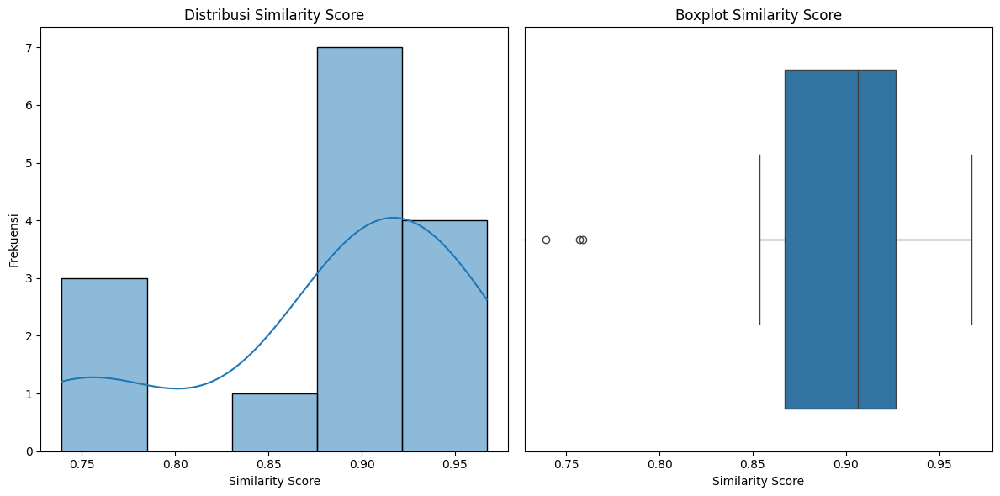

In [ ]:
import pandas as pd
import numpy as np
from collections import defaultdict, deque
import fitz  # PyMuPDF
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.metrics.pairwise import cosine_similarity
import torch
from transformers import DistilBertTokenizer, DistilBertModel
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan untuk mengunduh stopwords dan punkt sebelum menggunakan
import nltk
nltk.download('stopwords')
nltk.download('punkt')

# Ekstraksi teks dari PDF dan pra-pemrosesan
def extract_text_from_pdf(pdf_path):
    doc = fitz.open(pdf_path)
    text = ""
    for page in doc:
        text += page.get_text()
    return text

def preprocess_text(text):
    # Lowercasing
    text = text.lower()
    # Removing punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Removing stopwords
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text)
    filtered_text = ' '.join([word for word in words if word not in stop_words])
    return filtered_text

# Paths file resume
resume_paths = [
    '/content/Resume_1.pdf',
    '/content/Resume_2.pdf',
    '/content/Resume_3.pdf',
    '/content/Resume_4.pdf',
    '/content/Resume_5.pdf'
]

# Ekstrak dan pra-proses teks dari resume
resumes_texts = [preprocess_text(extract_text_from_pdf(path)) for path in resume_paths]

# Buat embeddings untuk resume
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

def get_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze()

resume_embeddings = [get_embedding(text) for text in resumes_texts]
resume_embeddings = torch.stack(resume_embeddings).numpy()  # Convert to numpy array for compatibility

# Load job embeddings dan data
job_embeddings = np.load('job_embeddings.npy')
job_data = pd.read_csv('job_data.csv')

# Pilih subset dari data pekerjaan, misalnya 3 pekerjaan
job_data_subset = job_data.sample(n=3, random_state=42)  # Memilih 3 pekerjaan secara acak
job_embeddings_subset = job_embeddings[job_data_subset.index]

# Fungsi untuk membuat mapping resume ke pekerjaan berdasarkan skor kesamaan
def create_mapping(resume_id, job_data, job_embeddings):
    # Hitung skor kesamaan
    similarity_scores = cosine_similarity([resume_embeddings[resume_id]], job_embeddings).flatten()
    job_data['similarity_score'] = similarity_scores

    # Tambahkan ID resume dan urutkan pekerjaan berdasarkan skor kesamaan
    job_data['resume_id'] = f'resume_{resume_id}'
    sorted_jobs = job_data.sort_values(by='similarity_score', ascending=False)
    return sorted_jobs[['resume_id', 'company', 'jobdescription', 'similarity_score']]

# Buat mapping untuk kelima resume
all_mappings = pd.DataFrame()
for resume_id in range(5):
    resume_mapping = create_mapping(resume_id, job_data_subset.copy(), job_embeddings_subset)
    all_mappings = pd.concat([all_mappings, resume_mapping])

# Simpan hasil mapping ke file CSV
all_mappings.to_csv('/content/resume_mapping.csv', index=False)

# Cetak hasil mapping
print(all_mappings)

# Fungsi untuk membuat daftar preferensi pekerjaan dan resume
def create_preference_lists(job_data):
    job_preferences = defaultdict(list)
    resume_preferences = defaultdict(list)

    # Buat preferensi berdasarkan skor kesamaan
    for _, row in job_data.iterrows():
        job_id = row['jobdescription']
        resume_id = row['resume_id']
        company = row['company']
        similarity_score = row['similarity_score']
        resume_preferences[resume_id].append((job_id, similarity_score, company))
        job_preferences[job_id].append((resume_id, similarity_score, company))

    # Urutkan preferensi berdasarkan skor kesamaan (descending)
    for resume in resume_preferences:
        resume_preferences[resume] = sorted(resume_preferences[resume], key=lambda x: x[1], reverse=True)

    for job in job_preferences:
        job_preferences[job] = sorted(job_preferences[job], key=lambda x: x[1], reverse=True)

    return resume_preferences, job_preferences

resume_preferences, job_preferences = create_preference_lists(all_mappings)

# Fungsi Gale-Shapley yang dimodifikasi
def gale_shapley_modified(resume_preferences, job_preferences, k):
    resume_matches = defaultdict(list)  # Pencocokan resume
    job_matches = defaultdict(list)     # Pencocokan pekerjaan
    free_resumes = deque(resume_preferences.keys())  # Daftar CV yang belum dicocokkan
    job_proposals = defaultdict(list)  # Daftar pekerjaan yang sudah dilamar oleh CV

    while free_resumes:
        resume = free_resumes.popleft()
        resume_pref_list = resume_preferences[resume]

        # Tentukan pekerjaan yang akan dilamar
        for job_id, score, company in resume_pref_list:
            if job_id not in job_proposals[resume]:
                job_proposals[resume].append(job_id)
                job_matches[job_id].append((resume, company, score))

                # Batalkan pencocokan jika pekerjaan sudah memiliki k CV
                if len(job_matches[job_id]) > k:
                    # Temukan resume yang paling tidak diinginkan
                    worst_resume = min(job_matches[job_id], key=lambda r: next((x[1] for x in resume_preferences[r[0]] if x[0] == job_id), float('inf')), default=None)

                    if worst_resume:
                        if worst_resume in job_matches[job_id]:
                            job_matches[job_id].remove(worst_resume)
                            if (job_id, worst_resume[1], worst_resume[2]) in resume_matches[worst_resume[0]]:
                                try:
                                    resume_matches[worst_resume[0]].remove((job_id, worst_resume[1]))
                                except ValueError:
                                    pass  # Item tidak ditemukan dalam daftar
                            free_resumes.append(worst_resume[0])

                resume_matches[resume].append((job_id, company, score))
                break

    return resume_matches, job_matches

# Jumlah CV yang diinginkan untuk setiap pekerjaan
k = 1  # Karena kita hanya memiliki 5 CV dan 3 pekerjaan
resume_matches, job_matches = gale_shapley_modified(resume_preferences, job_preferences, k)

# Menampilkan hasil pencocokan dengan format yang mudah dibaca
def display_matches(resume_matches, job_matches, all_mappings):
    # Menampilkan pencocokan resume dengan skor
    print("\nPencocokan Resume:")
    for resume, jobs in resume_matches.items():
        print(f"\nResume {resume} cocok dengan pekerjaan:")
        sorted_jobs = sorted(jobs, key=lambda x: x[2], reverse=True)  # Urutkan berdasarkan skor kemiripan
        for job_id, company, score in sorted_jobs:
            # Dapatkan skor kemiripan tertinggi
            score = all_mappings[(all_mappings['resume_id'] == resume) & (all_mappings['jobdescription'] == job_id)]['similarity_score'].values[0]
            print(f"  - Pekerjaan: {job_id}, Perusahaan: {company}, Skor Kemiripan: {score:.4f}")

    # Menampilkan pencocokan pekerjaan dengan skor
    print("\nPencocokan Pekerjaan:")
    for job, resumes in job_matches.items():
        print(f"\nPekerjaan {job} cocok dengan CV:")
        sorted_resumes = sorted(resumes, key=lambda x: x[2], reverse=True)  # Urutkan berdasarkan skor kemiripan
        for resume, company, score in sorted_resumes:
            print(f"  - Resume: {resume}, Perusahaan: {company}, Skor Kemiripan: {score:.4f}")

# Menampilkan hasil
display_matches(resume_matches, job_matches, all_mappings)

# Fungsi untuk mengevaluasi distribusi similarity score
def evaluate_similarity_distribution(all_mappings):
    plt.figure(figsize=(12, 6))

    # Histogram distribusi similarity score
    plt.subplot(1, 2, 1)
    sns.histplot(all_mappings['similarity_score'], kde=True)
    plt.title('Distribusi Similarity Score')
    plt.xlabel('Similarity Score')
    plt.ylabel('Frekuensi')

    # Boxplot untuk melihat distribusi dan outlier
    plt.subplot(1, 2, 2)
    sns.boxplot(x=all_mappings['similarity_score'])
    plt.title('Boxplot Similarity Score')
    plt.xlabel('Similarity Score')

    plt.tight_layout()
    plt.show()

# Menjalankan evaluasi distribusi similarity score
evaluate_similarity_distribution(all_mappings)
